# 1 数据加载与预处理

## 1.1 数据集基本信息

In [1]:
import math
import os

import numpy as np
import pandas as pd
import pickle
import seaborn as sns
import torch
import missingno as msno
from sklearn.impute import KNNImputer

from matplotlib import pyplot as plt
from scipy.stats import zscore, pearsonr, linregress
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier

# 尝试使用不同的中文字体选项
if os.name == 'nt':  # Windows系统
    plt.rcParams['font.sans-serif'] = ['Microsoft YaHei', 'SimHei', 'Arial Unicode MS']
else:  # macOS或Linux
    plt.rcParams['font.sans-serif'] = ['Heiti TC', 'Arial Unicode MS', 'STHeiti', 'sans-serif']

plt.rcParams['axes.unicode_minus'] = False  # 正确显示负号

with open('dataset.csv', "rb") as pkl_file:
    data = pd.read_csv(pkl_file)

# 1. 数据集基本信息
print("🟢 数据集维度:", data.shape)
print("🟢 数据基本信息:")
print(data.info())
print("🟢 缺失值统计:")
print(data.isnull().sum())
data.describe()

🟢 数据集维度: (76518, 38)
🟢 数据基本信息:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76518 entries, 0 to 76517
Data columns (total 38 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   id                                              76518 non-null  int64  
 1   Marital status                                  76518 non-null  int64  
 2   Application mode                                76518 non-null  int64  
 3   Application order                               76518 non-null  int64  
 4   Course                                          76518 non-null  int64  
 5   Daytime/evening attendance                      76518 non-null  int64  
 6   Previous qualification                          76518 non-null  int64  
 7   Previous qualification (grade)                  76518 non-null  float64
 8   Nacionality                                     76518 non-null  int64  
 9   Mother's

,id,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,...,76518.00000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000,76518.000000
mean,38258.500000,1.111934,16.054419,1.644410,9001.286377,0.915314,3.658760,132.378766,1.226600,19.837633,...,0.05796,0.137053,5.933414,7.234468,4.007201,9.626085,0.062443,11.520340,1.228218,-0.080921
std,22088.988286,0.441669,16.682337,1.229645,1803.438531,0.278416,8.623774,10.995328,3.392183,15.399456,...,0.40849,0.933830,1.627182,3.503040,2.772956,5.546035,0.462107,2.653375,1.398816,2.251382
min,0.000000,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,19129.250000,1.000000,1.000000,1.000000,9119.000000,1.000000,1.000000,125.000000,1.000000,1.000000,...,0.00000,0.000000,5.000000,6.000000,1.000000,10.000000,0.000000,9.400000,0.300000,-1.700000
50%,38258.500000,1.000000,17.000000,1.000000,9254.000000,1.000000,1.000000,133.100000,1.000000,19.000000,...,0.00000,0.000000,6.000000,7.000000,5.000000,12.142857,0.000000,11.100000,1.400000,0.320000
75%,57387.750000,1.000000,39.000000,2.000000,9670.000000,1.000000,1.000000,140.000000,1.000000,37.000000,...,0.00000,0.000000,6.000000,9.000000,6.000000,13.244048,0.000000,12.700000,2.600000,1.790000
max,76517.000000,6.000000,53.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,...,12.00000,19.000000,23.000000,33.000000,20.000000,18.000000,12.000000,16.200000,3.700000,3.510000


可以看出，数据集中并没有缺失值，可以进入下面的处理异常值阶段。

## 1.2 数据预处理

### 1.2.1数据异常值占比分析

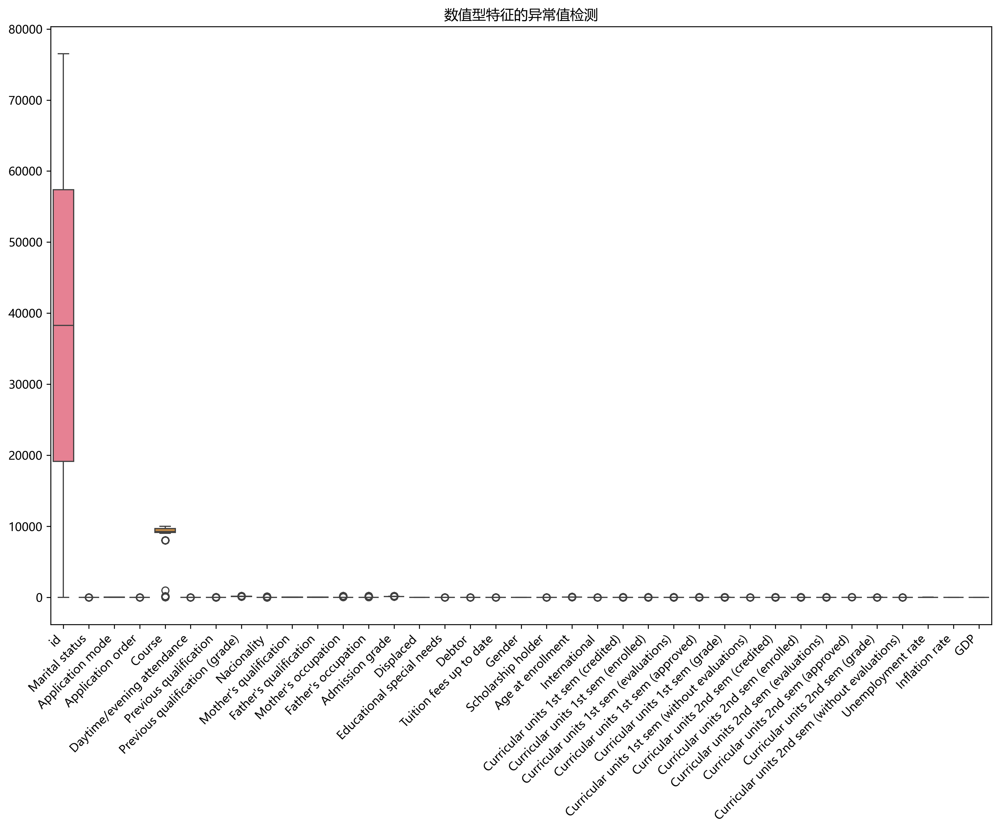

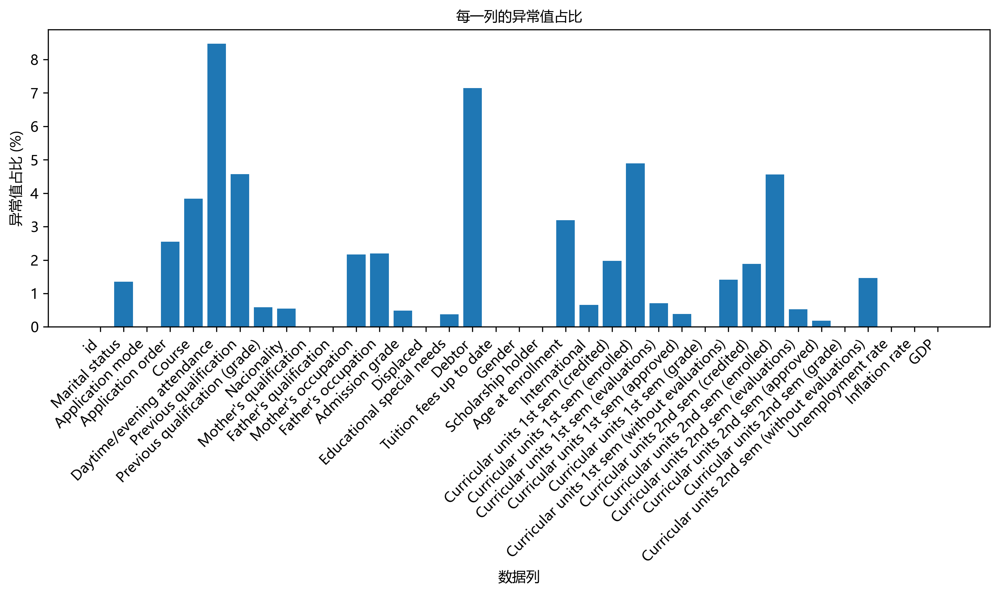

In [2]:
from matplotlib import font_manager

columns = data.columns.tolist()

# 总列数
n_cols = len(columns)

# 每行放多少个子图
n_cols_per_row = 6
n_rows = math.ceil(n_cols / n_cols_per_row)

# 创建画布
plt.figure(figsize=(n_cols_per_row * 5, n_rows * 4), dpi=300)

# 遍历每一列
for i, col in enumerate(columns, 1):
    plt.subplot(n_rows, n_cols_per_row, i)
    # 数值型列：画直方图 + KDE
    if pd.api.types.is_numeric_dtype(data[col]):
        sns.histplot(data[col].dropna(), kde=True, bins=20)
    else:
        # 类别型列：画前20类的条形图
        value_counts = data[col].value_counts().head(20)
        sns.barplot(x=value_counts.values, y=value_counts.index, hue=value_counts.index, 
            orient='h', palette='pastel', legend=False)
    plt.title(col)
    plt.tight_layout()

# 总标题
plt.suptitle('Distribution of Each Column in Dataset', fontsize=18, y=1.02)
plt.show()

numeric_cols = data.select_dtypes(include=['int64', 'float64']).columns.tolist()
plt.figure(figsize=(12, 10), dpi=300)
sns.boxplot(data=data[numeric_cols])
plt.xticks(rotation=45, ha='right')
plt.title("数值型特征的异常值检测")
plt.tight_layout()
plt.show()

# 计算Z-score
def z_score(series):
    return (series - series.mean()) / series.std()

# 统计每一列的异常值占比
outliers_ratio = {}

for column in data.select_dtypes(include=[np.number]).columns:
    z_scores = z_score(data[column])
    outliers = ((z_scores > 3) | (z_scores < -3)).sum()
    total_count = data[column].count()
    outliers_ratio[column] = outliers / total_count * 100  # 转换为百分比

# 将结果可视化
font_prop = font_manager.FontProperties()

plt.figure(figsize=(10, 6), dpi=300)
plt.bar(outliers_ratio.keys(), outliers_ratio.values())
plt.title('每一列的异常值占比', fontproperties=font_prop)
plt.xlabel('数据列', fontproperties=font_prop)
plt.ylabel('异常值占比 (%)', fontproperties=font_prop)
plt.xticks(rotation=45, ha='right', fontproperties=font_prop)
plt.tight_layout()
plt.show()

在本研究中，我们对数值型特征进行了系统的异常值检测，目的是识别可能存在的数据偏差或极端值，以提高后续建模的稳健性。

首先，使用 箱线图（Boxplot） 对所有数值型变量的分布进行了可视化，帮助我们初步观察各特征中是否存在离群值。结果显示，部分变量在上下四分位范围之外存在一定数量的异常点。

随后，我们采用 Z-score 标准分数法 对各数值型字段中的异常值进行量化分析。Z-score 是衡量每个数据点与该列均值之间的偏差程度，计算公式为：Z=(x-μ)/σ，其中 μ 和 σ 分别表示该列数据的均值和标准差。我们将 ∣Z∣>3 的数据视为异常值，并计算了每一列中异常值所占的比例。

图中展示了每个字段的异常值百分比分布，从中可以看出：
- 大部分特征的异常值占比低于3%，说明整体数据较为干净。
- 个别字段存在一定程度的异常值，但并未极端影响数据分布，因此在本阶段暂未剔除。

但是，数据中部分学生年龄偏大，因此我们选定：**只研究年龄不大于40岁的学生**。接下来进行数据预处理。

### 1.2.2 数据清洗
首先，精简列名，然后筛选出年龄不大于40岁学生的数据

根据数据集描述，数据可用于分析的列为Target列。先看看Targrt列有多少种值。

In [3]:
data.rename(columns = {"Nacionality": "Nationality", 
                           "Mother's qualification": "Mother_qualification", 
                           "Father's qualification": "Father_qualification", 
                           "Mother's occupation": "Mother_occupation",
                           "Father's occupation": "Father_occupation", 
                           "Age at enrollment": "Age"}, inplace = True)

# Replace white space in the column names with underscore
data.columns = data.columns.str.replace(' ', '_')

# Remove the parenthesis
data.columns = data.columns.str.replace('(', '')
data.columns = data.columns.str.replace(')', '')
exclude_cols = ['Unemployment rate', 'Inflation rate', 'GDP', 'Age'] 
exclude_cols += [col for col in data.columns if col.startswith('Curricular')]
# 遍历所有列，排除指定列后将其转换为 category
for col in data.columns:
    if col not in exclude_cols:
        data[col] = data[col].astype('category')
print(data.dtypes)

id                                              category
Marital_status                                  category
Application_mode                                category
Application_order                               category
Course                                          category
Daytime/evening_attendance                      category
Previous_qualification                          category
Previous_qualification_grade                    category
Nationality                                     category
Mother_qualification                            category
Father_qualification                            category
Mother_occupation                               category
Father_occupation                               category
Admission_grade                                 category
Displaced                                       category
Educational_special_needs                       category
Debtor                                          category
Tuition_fees_up_to_date        

In [4]:
data = data[data['Age'] <= 40]  
print(f"数据列Target含有的值：{data["Target"].unique()}")

数据列Target含有的值：['Graduate', 'Dropout', 'Enrolled']
Categories (3, object): ['Dropout', 'Enrolled', 'Graduate']


In [5]:
data['Target'] = data['Target'].map({
    'Dropout':0,
    'Enrolled':1,
    'Graduate':2
})

In [6]:
from scipy.stats import chi2_contingency

cats = ['Marital_status', 'Application_mode', 'Application_order', 
        'Course','Daytime/evening_attendance', 'Previous_qualification', 
        'Nationality','Mother_qualification', 'Father_qualification', 
        'Mother_occupation', 'Father_occupation', 'Displaced', 
        'Educational_special_needs', 'Debtor','Tuition_fees_up_to_date', 
        'Gender', 'Scholarship_holder','International']

# Get the p-values from Chi-Square indenpendence tests
p_value = []

for col in cats:
    crosstable = pd.crosstab(index = data[col], 
                             columns = data['Target'])
    p = chi2_contingency(crosstable)[1]
    p_value.append(p)

chi2_result = pd.DataFrame({
    'Variable': cats,
    'P_value': [round(ele, 5) for ele in p_value]
})

chi2_result = chi2_result.sort_values('P_value')

chi2_result

,Variable,P_value
0,Marital_status,0.00000
15,Gender,0.00000
14,Tuition_fees_up_to_date,0.00000
13,Debtor,0.00000
11,Displaced,0.00000
10,Father_occupation,0.00000
9,Mother_occupation,0.00000
16,Scholarship_holder,0.00000
8,Father_qualification,0.00000
6,Nationality,0.00000


In [7]:
data = data.drop(['Nationality', 'International', 'Educational_special_needs'], 
                              axis = 1)  

# 2 EDA(Exploratory Data Analysis)与可视化展示

## 2.1 数据互相关可视化
先宏观地看一下数据集中各变量之间的相互影响关系。

先查看一下Target列每种取值的数量各有多少。

id                                              0.001951
Marital_status                                 -0.109251
Application_mode                               -0.315614
Application_order                               0.122114
Course                                          0.162279
Daytime/evening_attendance                      0.125600
Previous_qualification                         -0.084419
Previous_qualification_grade                    0.139235
Mother_qualification                           -0.069660
Father_qualification                            0.001779
Mother_occupation                              -0.034047
Father_occupation                              -0.025344
Admission_grade                                 0.169951
Displaced                                       0.141508
Debtor                                         -0.246704
Tuition_fees_up_to_date                         0.410061
Gender                                         -0.328477
Scholarship_holder             

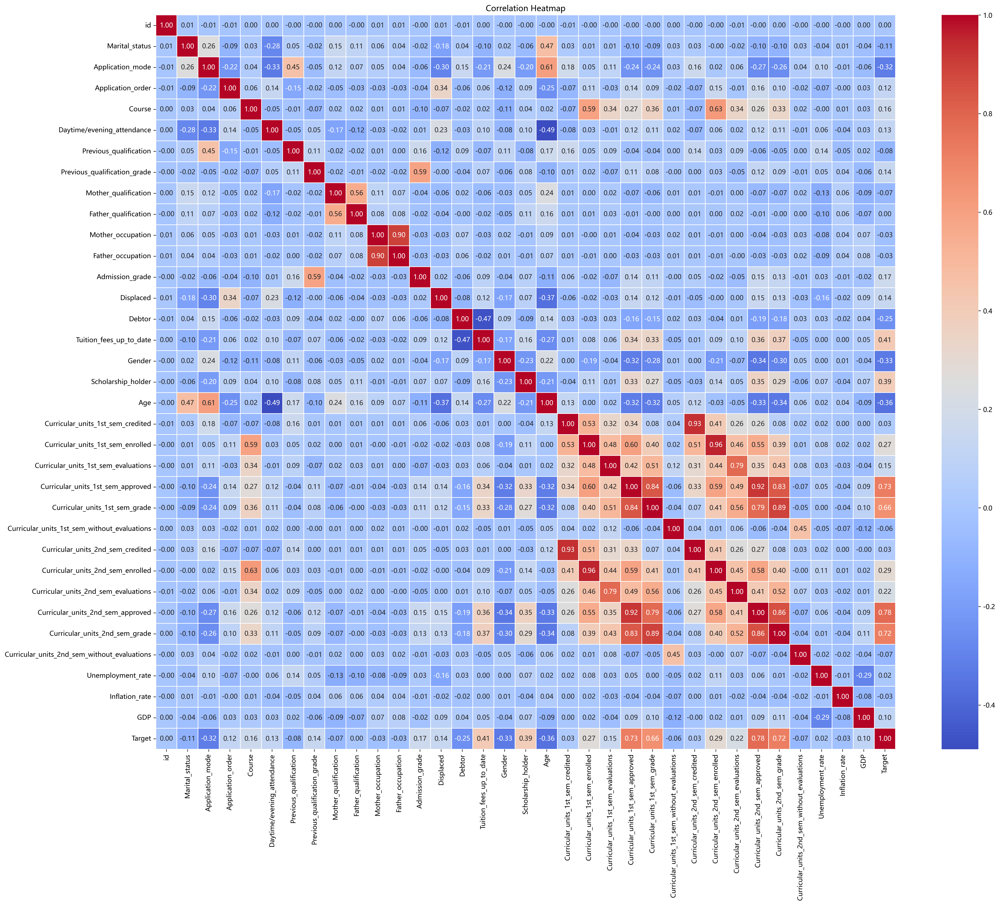

In [8]:
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

print(data.corr()['Target'])

plt.figure(figsize=(25, 20), dpi=300)
sns.heatmap(data.corr() , annot=True, cmap='coolwarm', linewidths=0.5, fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()

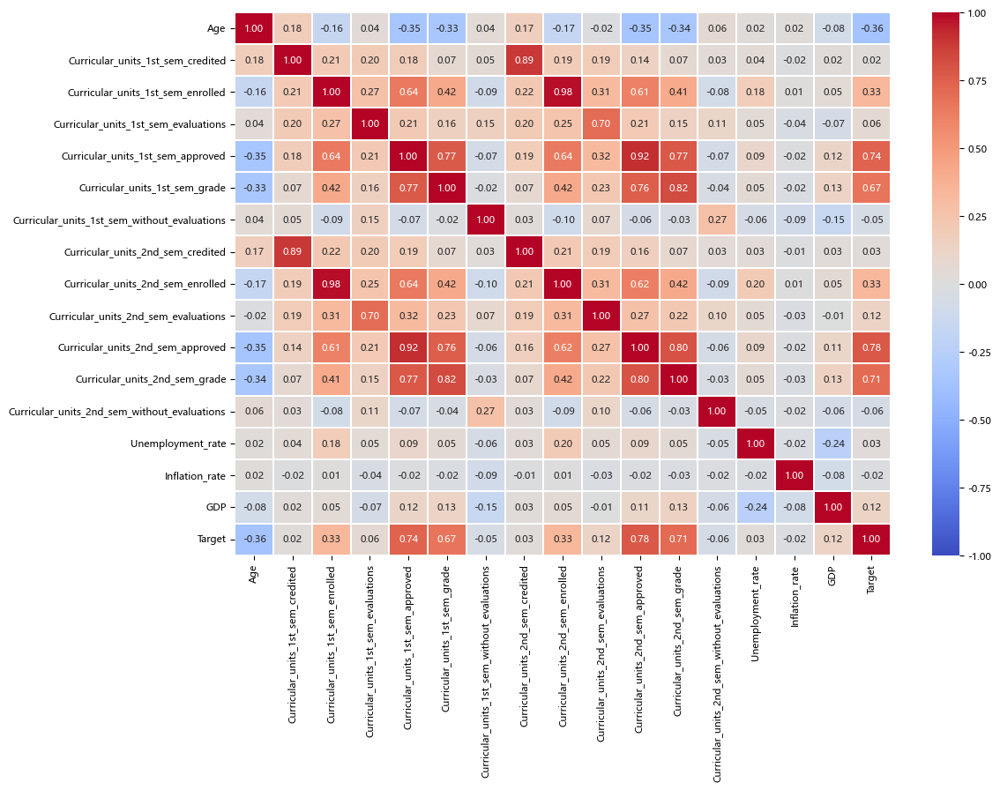

In [9]:
num_features = data[['Age',
       'Curricular_units_1st_sem_credited',
       'Curricular_units_1st_sem_enrolled',
       'Curricular_units_1st_sem_evaluations',
       'Curricular_units_1st_sem_approved', 
       'Curricular_units_1st_sem_grade',
       'Curricular_units_1st_sem_without_evaluations',
       'Curricular_units_2nd_sem_credited',
       'Curricular_units_2nd_sem_enrolled',
       'Curricular_units_2nd_sem_evaluations',
       'Curricular_units_2nd_sem_approved', 
       'Curricular_units_2nd_sem_grade',
       'Curricular_units_2nd_sem_without_evaluations', 
       'Unemployment_rate', 'Inflation_rate', 'GDP', 'Target']]

# Heatmap of correlation matrix
plt.figure(figsize = (12, 8))
plt.rcParams.update({'font.size': 8})
hm = sns.heatmap(num_features.corr(method = 'spearman'), 
                 cmap = 'coolwarm', annot = True, fmt = '.2f', 
                 linewidths = .2, vmin = -1, vmax = 1, center = 0)

## 2.2 分析target的相关影响因素
先对每一列进行分类，分为如下几类：
- Demographic data
- Socio-economic data
- Macro-economic data
- Academic data at enrollment
- Academic data at the end of 1st semester
- Academic data at the end of 2nd semester

In [10]:
feature_category_map = {
    'Marital status': 'Demographic data',
    'Nationality': 'Demographic data',
    'Displaced': 'Demographic data',
    'Gender': 'Demographic data',
    'Age': 'Demographic data',
    'International': 'Demographic data',
    
    'Father\'s qualification': 'Socio-economic data',
    'Mother\'s qualification': 'Socio-economic data',
    'Father\'s occupation': 'Socio-economic data',
    'Mother\'s occupation': 'Socio-economic data',
    'Educational special needs': 'Socio-economic data',
    'Debtor': 'Socio-economic data',
    'Tuition fees up to date': 'Socio-economic data',
    'Scholarship holder': 'Socio-economic data',
    
    'Unemployment rate': 'Macro-economic data',
    'Inflation rate': 'Macro-economic data',
    'GDP': 'Macro-economic data',
    
    'Application mode': 'Academic data at enrollment',
    'Application order': 'Academic data at enrollment',
    'Course': 'Academic data at enrollment',
    'Daytime/evening attendance': 'Academic data at enrollment',
    'Previous qualification': 'Academic data at enrollment',
    
    'Curricular units 1st sem (credited)': 'Academic data at the end of 1st semester',
    'Curricular units 1st sem (enrolled)': 'Academic data at the end of 1st semester',
    'Curricular units 1st sem (evaluations)': 'Academic data at the end of 1st semester',
    'Curricular units 1st sem (approved)': 'Academic data at the end of 1st semester',
    'Curricular units 1st sem (grade)': 'Academic data at the end of 1st semester',
    'Curricular units 1st sem (without evaluations)': 'Academic data at the end of 1st semester',
    
    'Curricular units 2nd sem (credited)': 'Academic data at the end of 2nd semester',
    'Curricular units 2nd sem (enrolled)': 'Academic data at the end of 2nd semester',
    'Curricular units 2nd sem (evaluations)': 'Academic data at the end of 2nd semester',
    'Curricular units 2nd sem (approved)': 'Academic data at the end of 2nd semester',
    'Curricular units 2nd sem (grade)': 'Academic data at the end of 2nd semester',
    'Curricular units 2nd sem (without evaluations)': 'Academic data at the end of 2nd semester'
}

下面使用多种初等方法来全面分析target列与其他列的关系。包括线性分析方法和集成树模型。
- 首先，分析Target类型是分类任务还是回归任务
- 接着，采用各类方法进行分析
  1. 相关性分析（Correlation）
  2. 随机森林特征重要性分析（Random Forest）
  3. 互信息分析（mutual_info_classif）
  4. 线性模型系数分析（Logistic）
- 然后，综合上述分析方法的结果，进行热图可视化，以柱状图的形式展示各种方法得到的最大影响因素，通过加权平均的方式得到最终结果。这是特征选择方法（叫做 Voting-Based Feature Selection 或 Ensemble Feature Importance）。
- 最后，对不同类别的特征进行分析，看看哪一类变量对于辍学率的影响最大。

In [11]:
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.feature_selection import mutual_info_regression, mutual_info_classif
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, accuracy_score, classification_report, confusion_matrix

print("🔍 开始Target列影响因素综合分析...")
print(f"数据形状: {data.shape}")

def analyze_target_relationships(data):
    """
    全面分析target列与其他列的关系
    """
    # 确保target列存在
    if 'Target' not in data.columns:
        print("错误: 数据中没有找到'target'列")
        return
    
    # 分离数值型和分类型特征
    numeric_features = ['Age',
       'Curricular_units_1st_sem_credited',
       'Curricular_units_1st_sem_enrolled',
       'Curricular_units_1st_sem_evaluations',
       'Curricular_units_1st_sem_approved', 
       'Curricular_units_1st_sem_grade',
       'Curricular_units_1st_sem_without_evaluations',
       'Curricular_units_2nd_sem_credited',
       'Curricular_units_2nd_sem_enrolled',
       'Curricular_units_2nd_sem_evaluations',
       'Curricular_units_2nd_sem_approved', 
       'Curricular_units_2nd_sem_grade',
       'Curricular_units_2nd_sem_without_evaluations', 
       'Unemployment_rate', 'Inflation_rate', 'GDP']
    # numeric_features = data.select_dtypes(include=[np.number]).columns.tolist()
    if 'Target' in numeric_features:
        numeric_features.remove('Target')
    
    print(f"数值型特征: {len(numeric_features)}个")
    
    # 判断target是回归还是分类问题
    target_unique = data['Target'].nunique()
    is_classification = target_unique <= 10 and data['Target'].dtype in ['int64', 'object', 'category']
    
    print(f"\nTarget类型: {'分类' if is_classification else '回归'}")
    print(f"Target唯一值数量: {target_unique}")
    
    return numeric_features, is_classification

# 1. 基础分析
numeric_features, is_classification = analyze_target_relationships(data)

if is_classification:
    print("该问题是分类问题，而非回归问题")
else:
    print("该问题是回归问题，而非分类问题")

🔍 开始Target列影响因素综合分析...
数据形状: (73588, 35)
数值型特征: 16个

Target类型: 分类
Target唯一值数量: 3
该问题是分类问题，而非回归问题


可以发现，该问题可抽象为分类问题：即学生辍学与否


1. 相关性分析


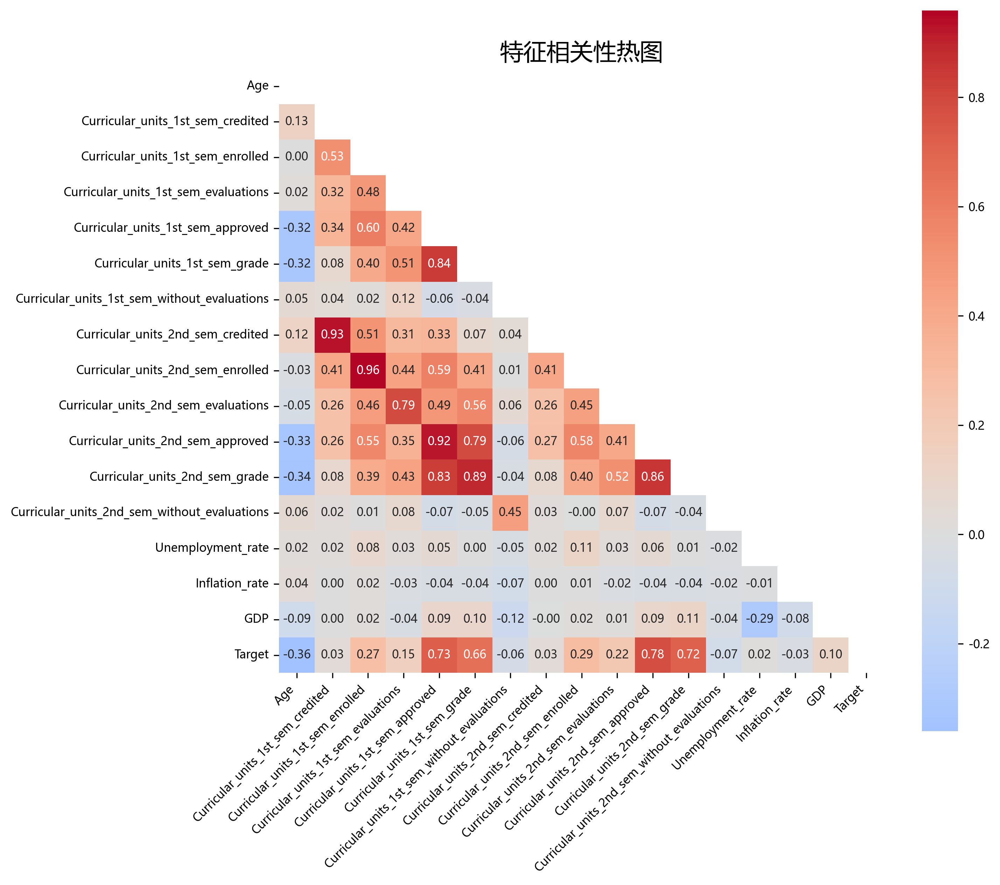

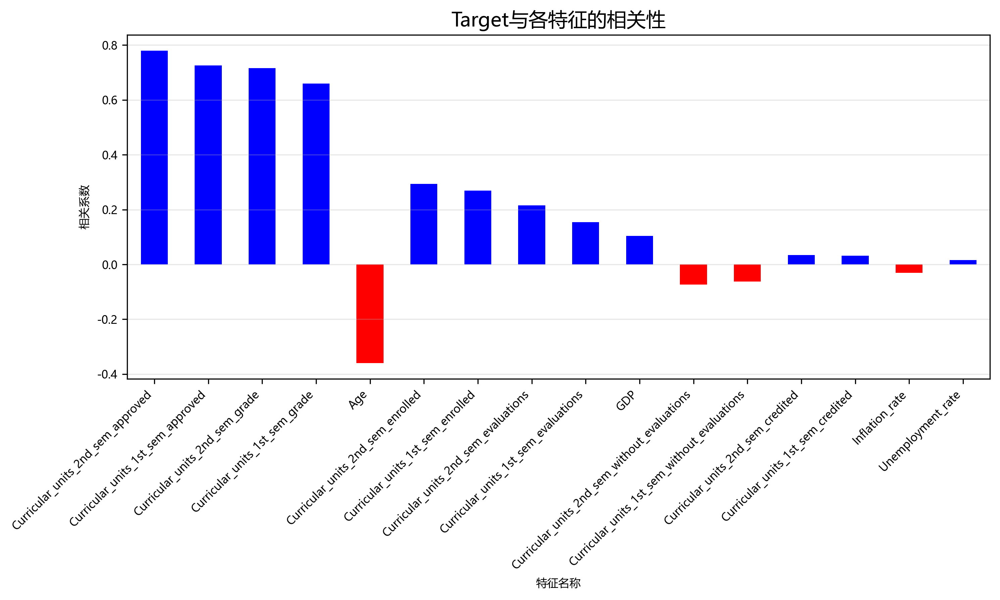

In [12]:
def correlation_analysis(data, numeric_features):
    """
    1 相关性分析
    """
    print("\n" + "="*50)
    print("1. 相关性分析")
    print("="*50)
    
    # 计算相关系数
    corr_matrix = data[numeric_features + ['Target']].corr()
    target_corr = corr_matrix['Target'].drop('Target').sort_values(key=abs, ascending=False)
    
    # 可视化相关性矩阵
    plt.figure(figsize=(10, 10), dpi=300) 
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, fmt='.2f', mask=mask, cbar_kws={"shrink": .8})
    plt.title('特征相关性热图', fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    # Target相关性柱状图
    plt.figure(figsize=(10, 6), dpi=300)
    target_corr.plot(kind='bar', color=['red' if x < 0 else 'blue' for x in target_corr])
    plt.title('Target与各特征的相关性', fontsize=14)
    plt.xlabel('特征名称')
    plt.ylabel('相关系数')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return target_corr
    
target_corr = correlation_analysis(data, numeric_features)

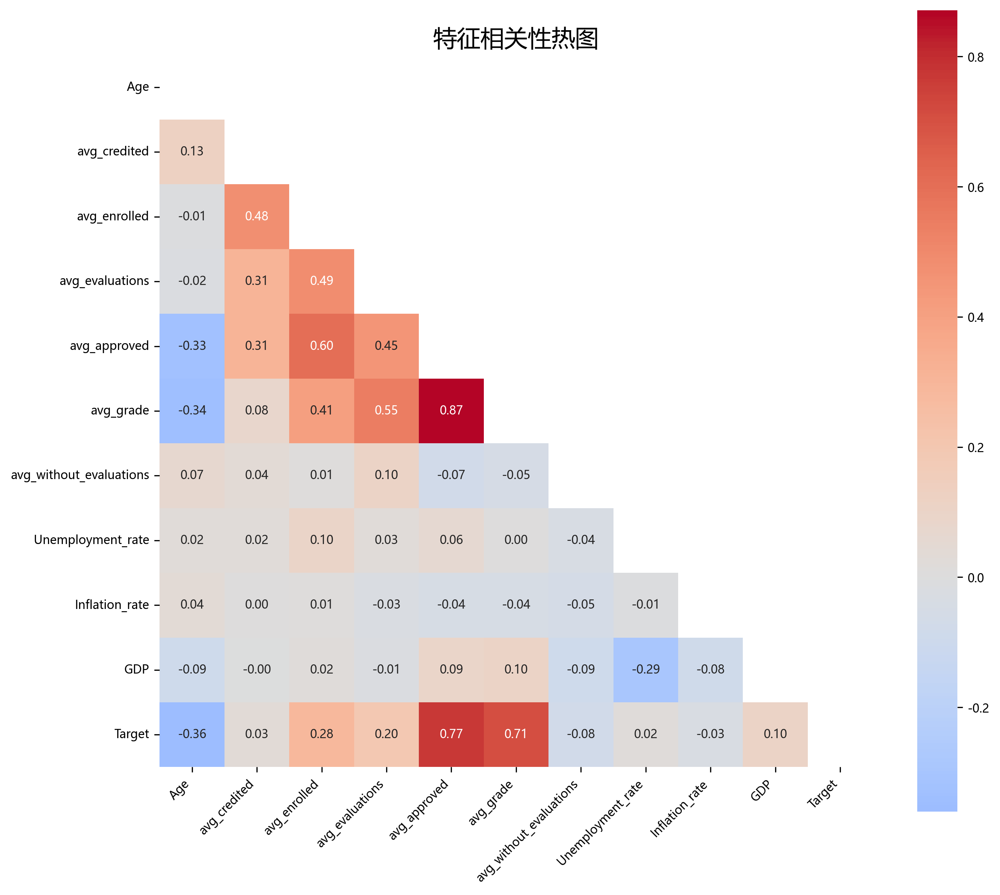

In [13]:
# Averaging academic performance data across two semesters
data['avg_credited'] = data[['Curricular_units_1st_sem_credited', 
                                'Curricular_units_2nd_sem_credited']].mean(axis = 1)
data['avg_enrolled'] = data[['Curricular_units_1st_sem_enrolled', 
                                'Curricular_units_2nd_sem_enrolled']].mean(axis = 1)
data['avg_evaluations'] = data[['Curricular_units_1st_sem_evaluations',
                                   'Curricular_units_2nd_sem_evaluations']].mean(axis = 1)
data['avg_approved'] = data[['Curricular_units_1st_sem_approved',
                                'Curricular_units_2nd_sem_approved']].mean(axis = 1)
data['avg_grade'] = data[['Curricular_units_1st_sem_grade',
                             'Curricular_units_2nd_sem_grade']].mean(axis = 1)
data['avg_without_evaluations'] = data[['Curricular_units_1st_sem_without_evaluations', 
                                           'Curricular_units_2nd_sem_without_evaluations']].mean(axis = 1)



numeric_features = ['Age', 'avg_credited', 'avg_enrolled', 
                    'avg_evaluations', 'avg_approved',
                    'avg_grade', 'avg_without_evaluations', 
                    'Unemployment_rate', 'Inflation_rate', 'GDP']

corr_matrix = data[numeric_features + ['Target']].corr()
target_corr = corr_matrix['Target'].drop('Target').sort_values(key=abs, ascending=False)

# 可视化相关性矩阵
plt.figure(figsize=(10, 10), dpi=300) 
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
            square=True, fmt='.2f', mask=mask, cbar_kws={"shrink": .8})
plt.title('特征相关性热图', fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [14]:
data = data.drop(columns = ['Curricular_units_1st_sem_credited', 
                                  'Curricular_units_1st_sem_enrolled', 
                                  'Curricular_units_1st_sem_evaluations', 
                                  'Curricular_units_1st_sem_approved', 
                                  'Curricular_units_1st_sem_grade', 
                                  'Curricular_units_1st_sem_without_evaluations', 
                                  'Curricular_units_2nd_sem_credited', 
                                  'Curricular_units_2nd_sem_enrolled', 
                                  'Curricular_units_2nd_sem_evaluations', 
                                  'Curricular_units_2nd_sem_approved', 
                                  'Curricular_units_2nd_sem_grade', 
                                  'Curricular_units_2nd_sem_without_evaluations'])
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 73588 entries, 0 to 76517
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   id                            73588 non-null  category
 1   Marital_status                73588 non-null  category
 2   Application_mode              73588 non-null  category
 3   Application_order             73588 non-null  category
 4   Course                        73588 non-null  category
 5   Daytime/evening_attendance    73588 non-null  category
 6   Previous_qualification        73588 non-null  category
 7   Previous_qualification_grade  73588 non-null  category
 8   Mother_qualification          73588 non-null  category
 9   Father_qualification          73588 non-null  category
 10  Mother_occupation             73588 non-null  category
 11  Father_occupation             73588 non-null  category
 12  Admission_grade               73588 non-null  categ


4. Logistic线性模型系数分析
✅ 逻辑回归准确率: 0.7924310368256556

📋 分类报告:
              precision    recall  f1-score   support

           0       0.88      0.78      0.83      4767
           1       0.59      0.51      0.54      2910
           2       0.81      0.92      0.86      7041

    accuracy                           0.79     14718
   macro avg       0.76      0.73      0.74     14718
weighted avg       0.79      0.79      0.79     14718



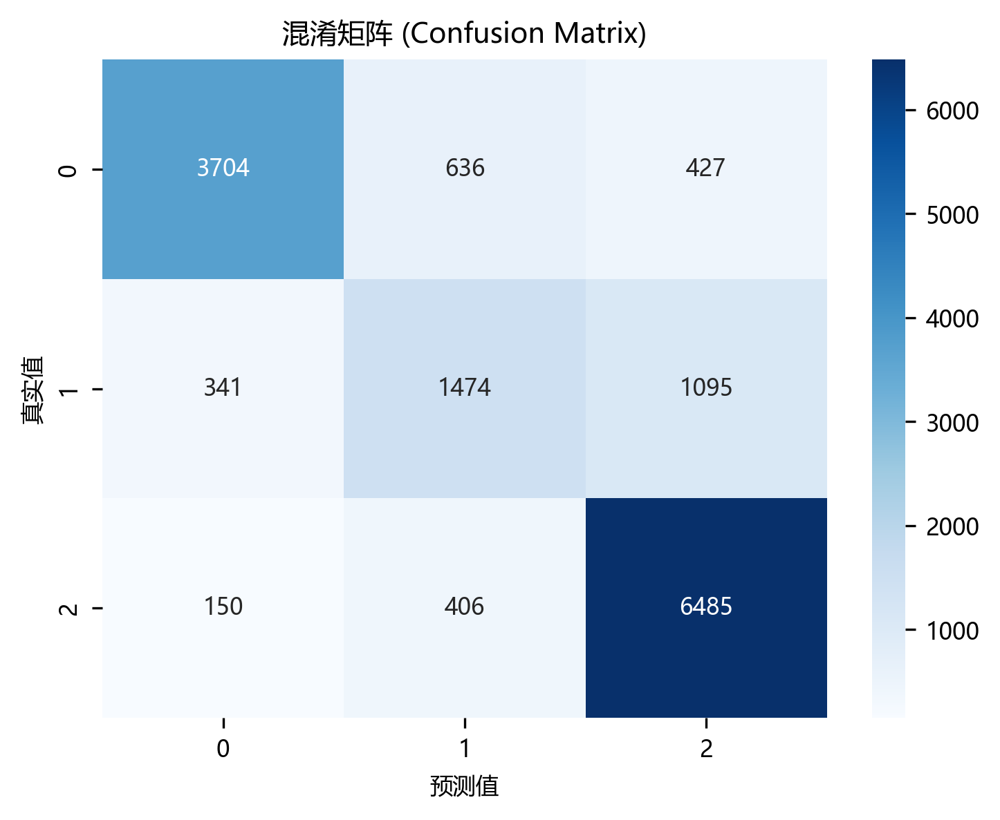

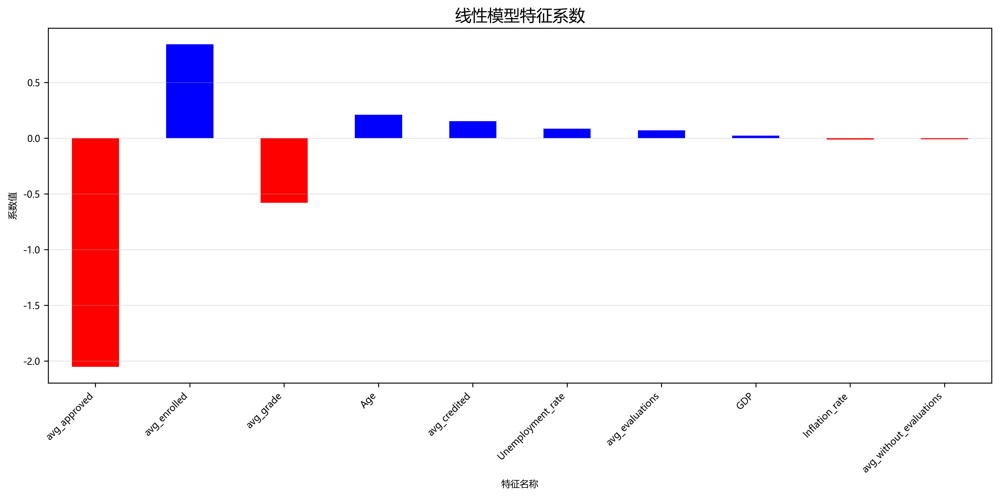

In [15]:
def linear_model_analysis(data, numeric_features):
    """
    1 Logistic线性模型系数分析
    """
    print("\n" + "="*50)
    print("4. Logistic线性模型系数分析")
    print("="*50)
    
    X = data[numeric_features]
    y = data['Target']
    
    # 标准化特征
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled = pd.DataFrame(X_scaled, columns=numeric_features)
    
    # 分割数据
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
    
    # 选择模型
    model = LogisticRegression(random_state=42, max_iter=1000)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    score = accuracy_score(y_test, y_pred)
    print(f"✅ 逻辑回归准确率: {score}")
    
    # 更详细的分类报告
    print("\n📋 分类报告:")
    print(classification_report(y_test, y_pred))

    # 混淆矩阵
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5, 4), dpi=300)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title("混淆矩阵 (Confusion Matrix)")
    plt.xlabel("预测值")
    plt.ylabel("真实值")
    plt.tight_layout()
    plt.show()
    
    # 获取系数
    if hasattr(model, 'coef_'):
        coefficients = pd.Series(model.coef_[0], index=numeric_features)
    
    # 按绝对值排序
    coefficients_abs = coefficients.reindex(coefficients.abs().sort_values(ascending=False).index)
    
    # 可视化系数
    plt.figure(figsize=(12, 6), dpi=300)
    coefficients_abs.plot(kind='bar', color=['red' if x < 0 else 'blue' for x in coefficients_abs])
    plt.title('线性模型特征系数', fontsize=14)
    plt.xlabel('特征名称')
    plt.ylabel('系数值')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return coefficients_abs

# 4. 线性模型分析
linear_coef = linear_model_analysis(data, numeric_features)


2.1 随机森林特征重要性分析
✅ 随机森林准确率: 0.7773474656882728

📋 分类报告:
              precision    recall  f1-score   support

           0       0.84      0.80      0.82      4767
           1       0.55      0.51      0.53      2910
           2       0.83      0.88      0.85      7041

    accuracy                           0.78     14718
   macro avg       0.74      0.73      0.73     14718
weighted avg       0.77      0.78      0.77     14718



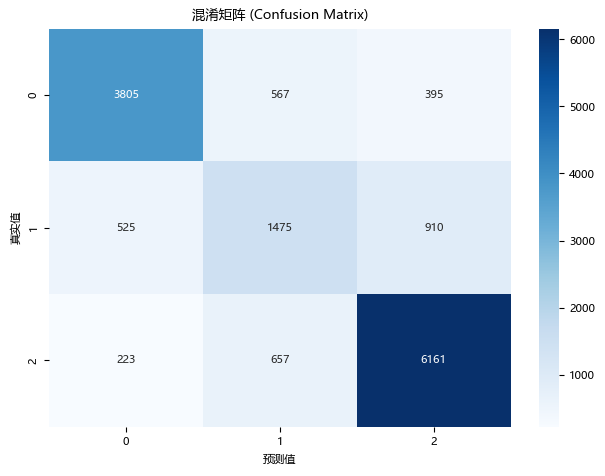

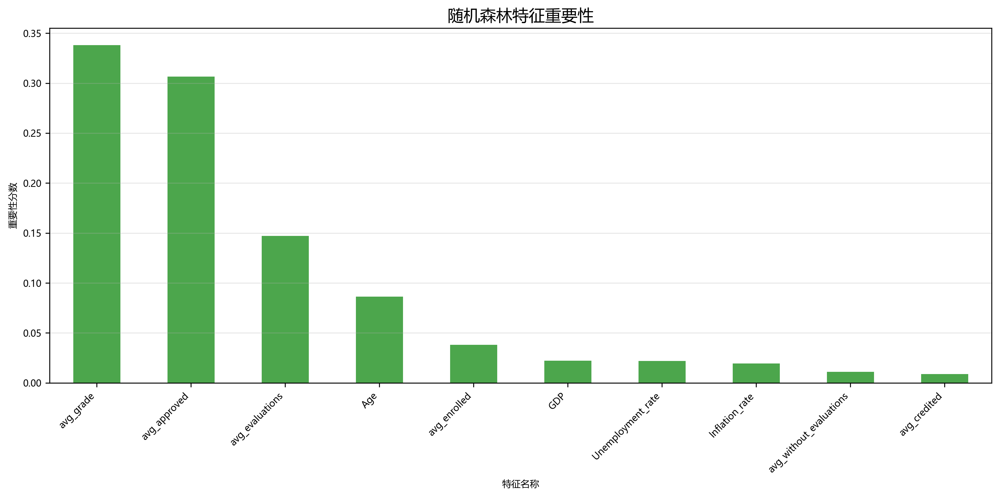

In [16]:
def random_forest_analysis(data, numeric_features):
    """
    2 随机森林特征重要性分析
    """
    print("\n" + "="*50)
    print("2.1 随机森林特征重要性分析")
    print("="*50)
    
    X = data[numeric_features]
    y = data['Target']
    
    # 分割训练测试集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # 模型训练
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X_train, y_train)
    
    # 预测与评估
    y_pred = rf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"✅ 随机森林准确率: {acc}\n")
    
    # 分类报告
    print("📋 分类报告:")
    print(classification_report(y_test, y_pred))

    # 混淆矩阵
    cm = confusion_matrix(y_test, y_pred)
    # plt.figure(figsize=(5, 4), dpi=300)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title("混淆矩阵 (Confusion Matrix)")
    plt.xlabel("预测值")
    plt.ylabel("真实值")
    plt.tight_layout()
    plt.show()
    
    # 特征重要性
    feature_importance = pd.Series(rf.feature_importances_, index=numeric_features).sort_values(ascending=False)
    
    # 可视化特征重要性
    plt.figure(figsize=(12, 6), dpi=300)
    feature_importance.plot(kind='bar', color='green', alpha=0.7)
    plt.title('随机森林特征重要性', fontsize=14)
    plt.xlabel('特征名称')
    plt.ylabel('重要性分数')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return feature_importance

# 2. 随机森林分析
rf_importance = random_forest_analysis(data, numeric_features)


2.2 随机森林特征重要性分析（含参数调优）
Fitting 5 folds for each of 20 candidates, totalling 100 fits
🎯 最佳参数: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 10, 'bootstrap': False}

✅ 随机森林准确率: 0.7990

📋 分类报告:
              precision    recall  f1-score   support

           0       0.89      0.79      0.83      4767
           1       0.59      0.54      0.57      2910
           2       0.82      0.91      0.87      7041

    accuracy                           0.80     14718
   macro avg       0.77      0.75      0.75     14718
weighted avg       0.80      0.80      0.80     14718



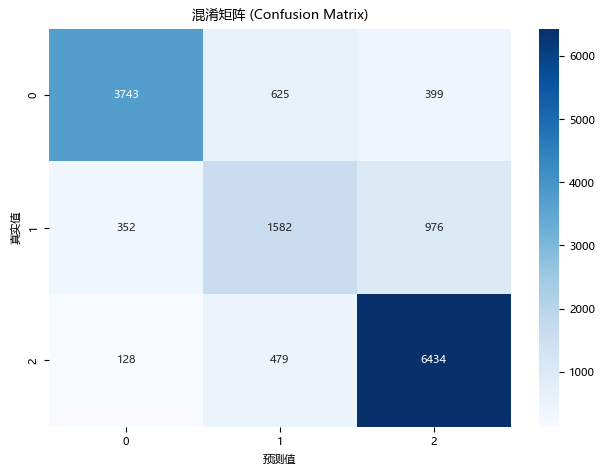

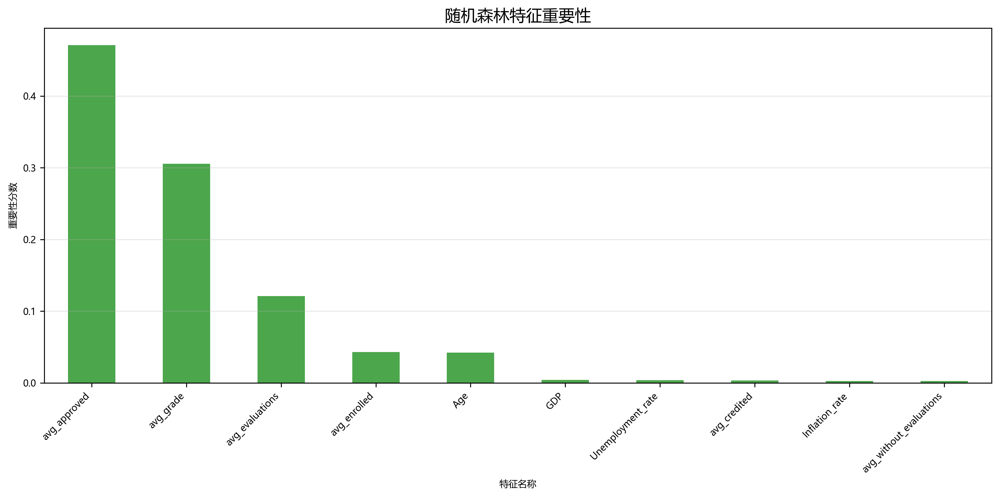

avg_approved               0.471113
avg_grade                  0.305629
avg_evaluations            0.121207
avg_enrolled               0.042897
Age                        0.042393
GDP                        0.004293
Unemployment_rate          0.003915
avg_credited               0.003468
Inflation_rate             0.002556
avg_without_evaluations    0.002530
dtype: float64

In [17]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

def random_forest_analysis(data, numeric_features):
    """
    随机森林特征重要性分析（含参数调优）
    """
    print("\n" + "="*50)
    print("2.2 随机森林特征重要性分析（含参数调优）")
    print("="*50)
    
    X = data[numeric_features]
    y = data['Target']
    
    # 分割训练测试集
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # 随机森林参数空间
    param_dist = {
        'n_estimators': [50, 100, 200, 300],
        'max_depth': [None, 5, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }
    
    rf = RandomForestClassifier(random_state=42)

    # 随机搜索交叉验证
    rand_search = RandomizedSearchCV(
        rf, param_distributions=param_dist,
        n_iter=20,  # 迭代次数，可以调大提升效果
        cv=5,
        verbose=1,
        random_state=42,
        n_jobs=-1  # 并行加速
    )

    rand_search.fit(X_train, y_train)
    best_rf = rand_search.best_estimator_

    print(f"🎯 最佳参数: {rand_search.best_params_}\n")

    # 预测与评估
    y_pred = best_rf.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"✅ 随机森林准确率: {acc:.4f}\n")
    
    # 分类报告
    print("📋 分类报告:")
    print(classification_report(y_test, y_pred))

    # 混淆矩阵
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title("混淆矩阵 (Confusion Matrix)")
    plt.xlabel("预测值")
    plt.ylabel("真实值")
    plt.tight_layout()
    plt.show()
    
    # 特征重要性
    feature_importance = pd.Series(best_rf.feature_importances_, index=numeric_features).sort_values(ascending=False)
    
    # 可视化特征重要性
    plt.figure(figsize=(12, 6), dpi=300)
    feature_importance.plot(kind='bar', color='green', alpha=0.7)
    plt.title('随机森林特征重要性', fontsize=14)
    plt.xlabel('特征名称')
    plt.ylabel('重要性分数')
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    return feature_importance
random_forest_analysis(data, numeric_features)

# 3 高级模型
使用CatBoost和LightGBM，支持原生分类
下面这步是把所有离散值的列类型从int64转换为category，但模型实际训练效果似乎效果并不显著，于是注释掉

## 3.1 三分类
沿用之前的做法，抽象为三分类问题，考虑辍学、未毕业、已毕业三种情况，看看模型的效果。
结果为：预测准确率约79%


CatBoost 分类报告:
              precision    recall  f1-score   support

           0     0.9050    0.8099    0.8548      4707
           1     0.6202    0.6592    0.6391      2920
           2     0.8656    0.9035    0.8842      7091

    accuracy                         0.8251     14718
   macro avg     0.7969    0.7909    0.7927     14718
weighted avg     0.8295    0.8251    0.8262     14718


LightGBM 分类报告:
              precision    recall  f1-score   support

           0     0.8958    0.8205    0.8565      4707
           1     0.6453    0.6243    0.6346      2920
           2     0.8587    0.9182    0.8875      7091

    accuracy                         0.8286     14718
   macro avg     0.8000    0.7877    0.7929     14718
weighted avg     0.8283    0.8286    0.8274     14718

模型评估指标：
      Model  Accuracy  F1 Score  Train Time (s)
0  CatBoost  0.825112  0.826150       17.567086
1  LightGBM  0.828645  0.827413        2.086993


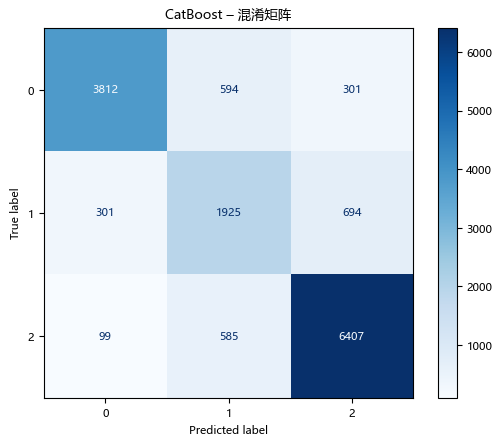

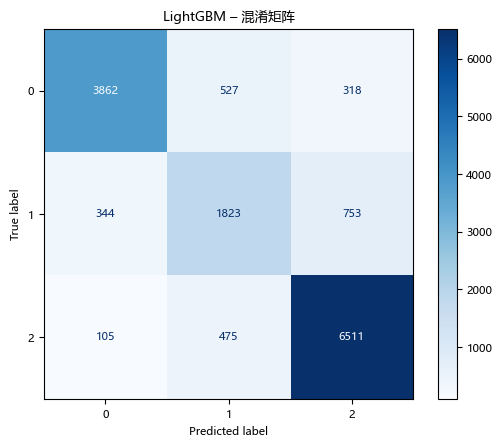


CatBoost 特征重要性（前10个）：
                    Feature  Importance
25             avg_approved   25.755147
26                avg_grade    7.492301
24          avg_evaluations    7.361907
23             avg_enrolled    6.702885
15  Tuition_fees_up_to_date    5.686803
18                      Age    5.229322
4                    Course    5.210292
11        Father_occupation    4.602536
10        Mother_occupation    3.520223
8      Mother_qualification    3.099147


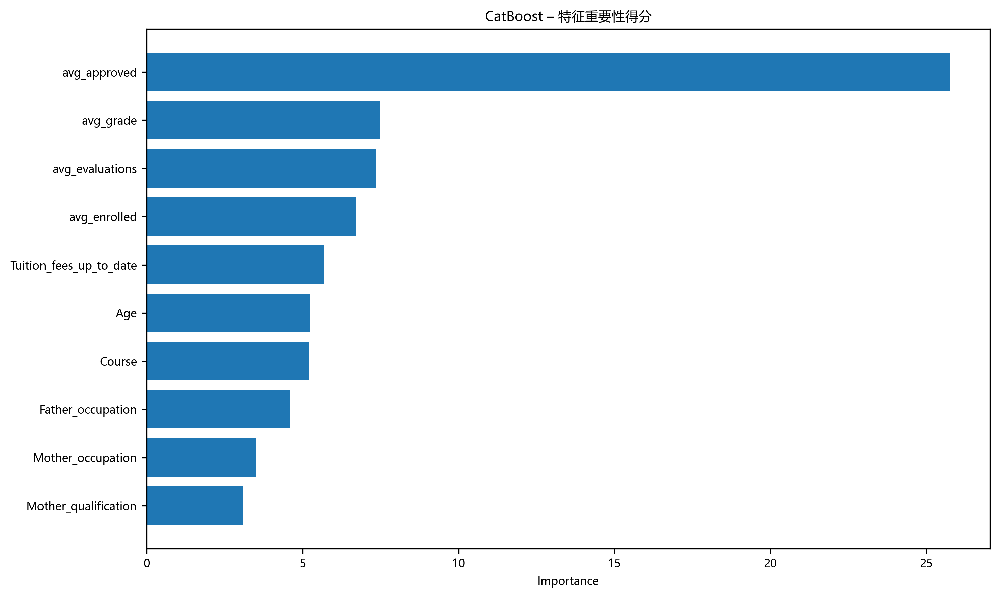


LightGBM 特征重要性（前10个）：
                         Feature  Importance
25                  avg_approved         997
4                         Course         736
24               avg_evaluations         619
26                     avg_grade         598
18                           Age         526
23                  avg_enrolled         507
12               Admission_grade         494
11             Father_occupation         483
7   Previous_qualification_grade         459
10             Mother_occupation         389


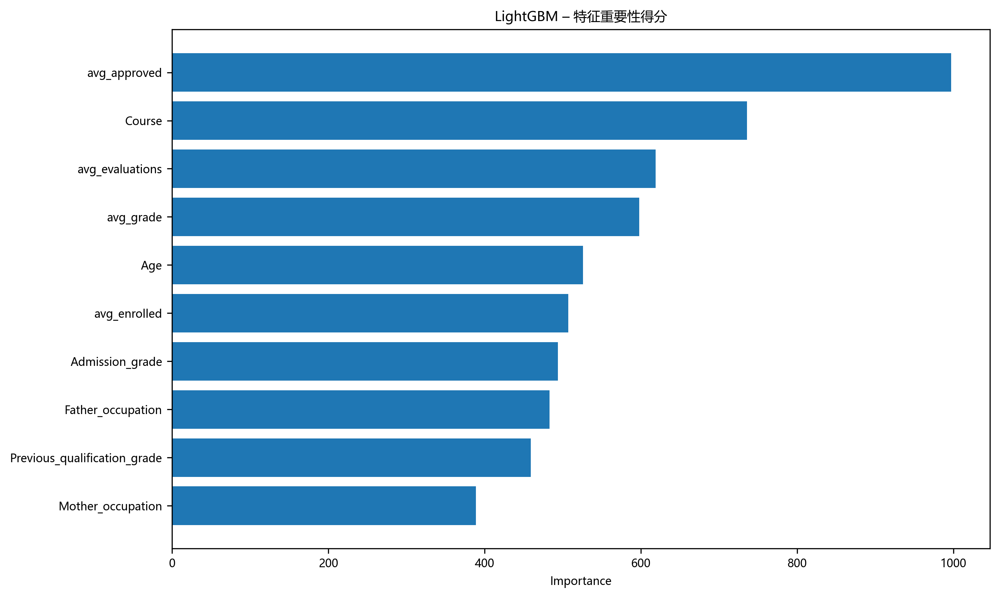

In [18]:
import time
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, f1_score
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.datasets import make_classification

# 模拟数据结构
X = data.drop(columns=['Target'])  # 删除 'Target' 列，得到特征
y = data['Target']

# 拆分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)
# 预处理：标准化
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 定义模型
models = {
    'CatBoost': CatBoostClassifier(iterations=100, learning_rate=0.1, depth=10, 
                                   loss_function='MultiClass', verbose=0, random_state=42),
    'LightGBM': LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=10,
                               class_weight='balanced', verbosity=-1, random_state=42)
}

results = []
conf_matrices = {}
feature_importances = {}

for name, model in models.items():
    pipe = Pipeline(steps=[
        ('smote', SMOTE(random_state=42)),
        ('clf', model)
    ])

    # 训练模型并计时
    start_time = time.time()
    pipe.fit(X_train_scaled, y_train)
    train_time = time.time() - start_time

    # 预测结果
    y_pred = pipe.predict(X_test_scaled)

    # 计算评估指标
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)
    conf_matrices[name] = cm

    print(f"\n{name} 分类报告:")
    print(classification_report(y_test, y_pred, digits=4))

    # 保存结果
    results.append({
        'Model': name,
        'Accuracy': acc,
        'F1 Score': f1,
        'Train Time (s)': train_time
    })

    # === 提取特征重要性（注意要取分类器） ===
    clf = pipe.named_steps['clf']
    if hasattr(clf, 'feature_importances_'):
        feature_importance = clf.feature_importances_
        feature_importances[name] = pd.DataFrame({
            'Feature': X.columns,
            'Importance': feature_importance
        }).sort_values(by='Importance', ascending=False)

# 评估指标表格输出
results_df = pd.DataFrame(results)
print("模型评估指标：")
print(results_df)

# 绘制混淆矩阵
for name, cm in conf_matrices.items():
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'{name} – 混淆矩阵')
    plt.show()

# 绘制特征重要性图和表格
for name, df in feature_importances.items():
    print(f"\n{name} 特征重要性（前10个）：")
    print(df.head(10))  # 显示前10个最重要特征

    plt.figure(figsize=(10, 6), dpi=300)
    plt.barh(df['Feature'][:10][::-1], df['Importance'][:10][::-1])  # 画前10个
    plt.xlabel("Importance")
    plt.title(f"{name} – 特征重要性得分")
    plt.tight_layout()
    plt.show()

fine tune

Fitting 3 folds for each of 20 candidates, totalling 60 fits

CatBoost 最佳参数：
{'clf__depth': 6, 'clf__iterations': 305, 'clf__l2_leaf_reg': 2.955303037866204, 'clf__learning_rate': 0.028223608778806232}

CatBoost 分类报告:
              precision    recall  f1-score   support

           0     0.9039    0.8052    0.8517      4707
           1     0.6043    0.6599    0.6309      2920
           2     0.8649    0.8948    0.8796      7091

    accuracy                         0.8195     14718
   macro avg     0.7910    0.7866    0.7874     14718
weighted avg     0.8257    0.8195    0.8213     14718

Fitting 3 folds for each of 20 candidates, totalling 60 fits

LightGBM 最佳参数：
{'clf__colsample_bytree': 0.7615344684232164, 'clf__learning_rate': 0.016489224710898157, 'clf__max_depth': 5, 'clf__n_estimators': 151, 'clf__num_leaves': 26, 'clf__reg_alpha': 0.5035645916507283, 'clf__reg_lambda': 0.9944970117847709, 'clf__subsample': 0.7203513239267079}

LightGBM 分类报告:
              precision    recall

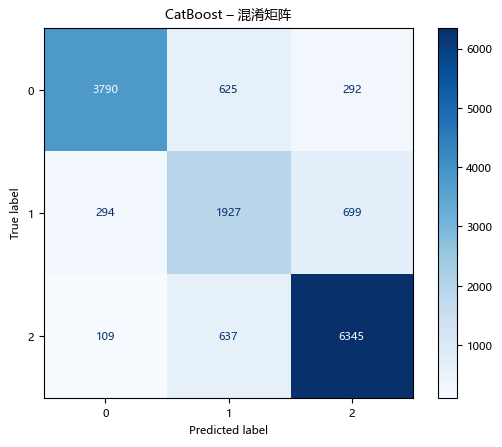

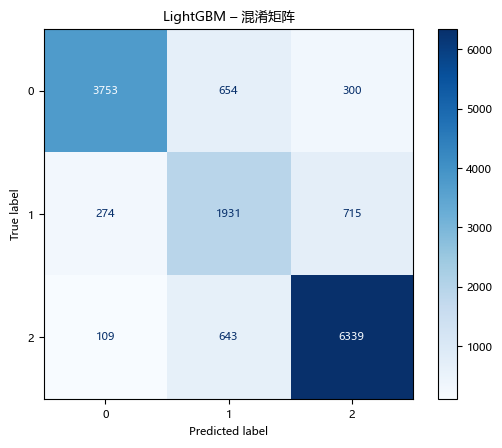

In [19]:
from scipy.stats import uniform, randint

# 模拟数据结构
X = data.drop(columns=['Target'])  # 删除 'Target' 列，得到特征
y = data['Target']

# 拆分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

# 预处理：标准化
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 定义模型
# 设定参数搜索空间
catboost_param_dist = {
    'clf__iterations': randint(100, 500),
    'clf__learning_rate': uniform(0.01, 0.1),
    'clf__depth': randint(4, 10),
    'clf__l2_leaf_reg': uniform(1, 5)
}

lgbm_param_dist = {
    'clf__n_estimators': randint(100, 500),
    'clf__learning_rate': uniform(0.01, 0.1),
    'clf__max_depth': randint(4, 10),
    'clf__num_leaves': randint(15, 60),
    'clf__reg_alpha': uniform(0, 2),
    'clf__reg_lambda': uniform(0, 2),
    'clf__subsample': uniform(0.6, 0.4),
    'clf__colsample_bytree': uniform(0.6, 0.4)
}

# 定义基础模型
catboost_base = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('clf', CatBoostClassifier(loss_function='MultiClass', verbose=0, random_state=42))
])

lgbm_base = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('clf', LGBMClassifier(class_weight='balanced', verbosity=-1, random_state=42))
])

# 搜索器定义
catboost_search = RandomizedSearchCV(
    estimator=catboost_base,
    param_distributions=catboost_param_dist,
    n_iter=20,
    cv=3,
    scoring='f1_weighted',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

lgbm_search = RandomizedSearchCV(
    estimator=lgbm_base,
    param_distributions=lgbm_param_dist,
    n_iter=20,
    cv=3,
    scoring='f1_weighted',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# 调参模型集合
models = {
    'CatBoost': catboost_search,
    'LightGBM': lgbm_search
}

results = []
conf_matrices = {}
feature_importances = {}

for name, model in models.items():
    pipe = Pipeline(steps=[
        ('smote', SMOTE(random_state=42)),
        ('clf', model)
    ])

    # 训练模型并计时
    start_time = time.time()
    pipe.fit(X_train_scaled, y_train)
    train_time = time.time() - start_time

    print(f"\n{name} 最佳参数：")
    print(model.best_params_)

    # 预测结果
    y_pred = pipe.predict(X_test_scaled)

    # 计算评估指标
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)
    conf_matrices[name] = cm

    print(f"\n{name} 分类报告:")
    print(classification_report(y_test, y_pred, digits=4))

    # 保存结果
    results.append({
        'Model': name,
        'Accuracy': acc,
        'F1 Score': f1,
        'Train Time (s)': train_time
    })

    # === 提取特征重要性（注意要取分类器） ===
    clf = pipe.named_steps['clf']
    if hasattr(clf, 'feature_importances_'):
        feature_importance = clf.feature_importances_
        feature_importances[name] = pd.DataFrame({
            'Feature': X.columns,
            'Importance': feature_importance
        }).sort_values(by='Importance', ascending=False)

# 评估指标表格输出
results_df = pd.DataFrame(results)
print("模型评估指标：")
print(results_df)

# 绘制混淆矩阵
for name, cm in conf_matrices.items():
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'{name} – 混淆矩阵')
    plt.show()

# 绘制特征重要性图和表格
for name, df in feature_importances.items():
    print(f"\n{name} 特征重要性（前10个）：")
    print(df.head(10))  # 显示前10个最重要特征

    plt.figure(figsize=(10, 6), dpi=300)
    plt.barh(df['Feature'][:10][::-1], df['Importance'][:10][::-1])  # 画前10个
    plt.xlabel("Importance")
    plt.title(f"{name} – 特征重要性得分")
    plt.tight_layout()
    plt.show()

## 3.2 二分类
采用二分类，简化问题，模型理应表现得更好

<class 'pandas.core.frame.DataFrame'>
Index: 58988 entries, 0 to 76517
Data columns (total 29 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   id                            58988 non-null  category
 1   Marital_status                58988 non-null  category
 2   Application_mode              58988 non-null  category
 3   Application_order             58988 non-null  category
 4   Course                        58988 non-null  category
 5   Daytime/evening_attendance    58988 non-null  category
 6   Previous_qualification        58988 non-null  category
 7   Previous_qualification_grade  58988 non-null  category
 8   Mother_qualification          58988 non-null  category
 9   Father_qualification          58988 non-null  category
 10  Mother_occupation             58988 non-null  category
 11  Father_occupation             58988 non-null  category
 12  Admission_grade               58988 non-null  categ

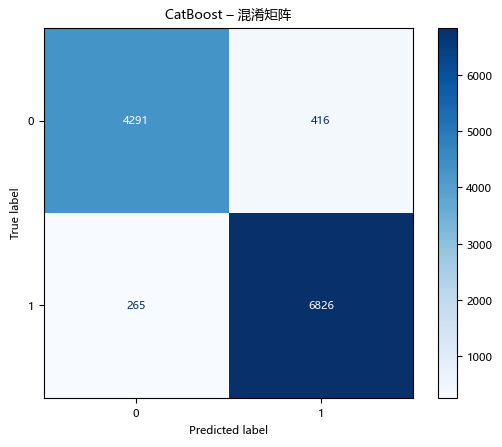

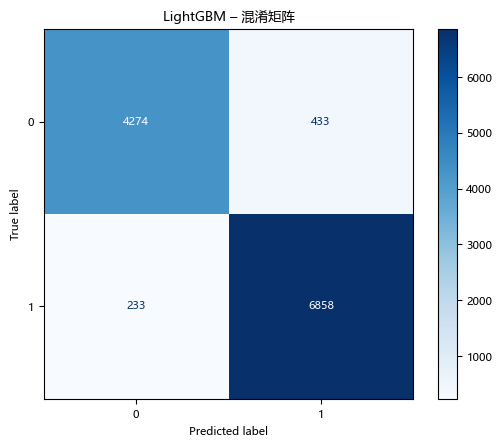


CatBoost 特征重要性（前10个）：
                    Feature  Importance
25             avg_approved   27.818984
23             avg_enrolled    9.338600
26                avg_grade    6.873994
15  Tuition_fees_up_to_date    6.577300
4                    Course    5.752535
17       Scholarship_holder    4.536288
2          Application_mode    4.261623
9      Father_qualification    3.627324
10        Mother_occupation    3.049005
19        Unemployment_rate    2.800467


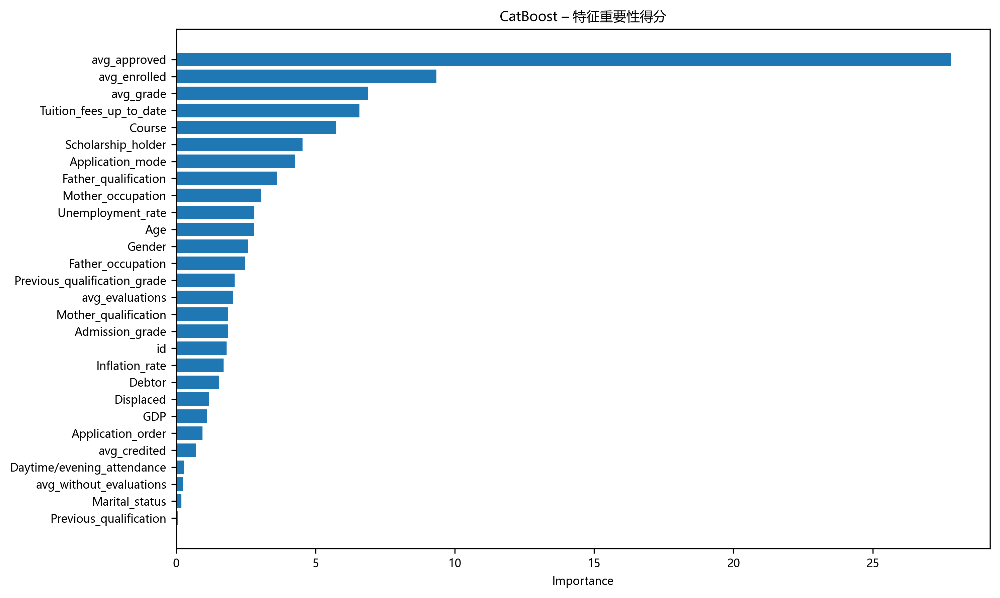


LightGBM 特征重要性（前10个）：
                         Feature  Importance
25                  avg_approved         385
23                  avg_enrolled         221
4                         Course         208
26                     avg_grade         206
0                             id         157
12               Admission_grade         153
24               avg_evaluations         149
9           Father_qualification         145
7   Previous_qualification_grade         135
11             Father_occupation         130


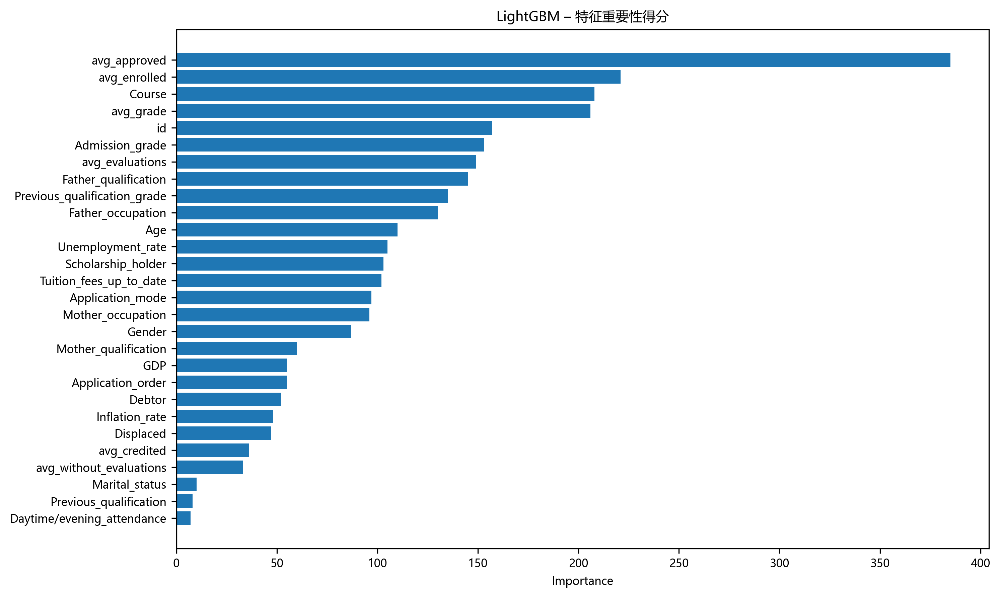

In [22]:
# === 1. 复制数据并构造二分类标签 ===
binary_data = data.copy()
# 删除 Target 列为 1 的行
binary_data = binary_data[binary_data['Target'] != 1]
# 将 Target 列为 2 的行改为 1
binary_data.loc[binary_data['Target'] == 2, 'Target'] = 1

X = binary_data.drop(columns=['Target'])  # 删除 'Target' 列，得到特征
y = binary_data['Target']

binary_data.info()

# 拆分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

# 预处理：标准化
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 定义模型
models = {
    'CatBoost': CatBoostClassifier(iterations=100, learning_rate=0.1, depth=10, 
                                   loss_function='MultiClass', verbose=0, random_state=42),
    'LightGBM': LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=10,
                               class_weight='balanced', verbosity=-1, random_state=42)
}

results = []
conf_matrices = {}
feature_importances = {}

for name, model in models.items():
    pipe = Pipeline(steps=[
        ('smote', SMOTE(random_state=42)),
        ('clf', model)
    ])

    # 训练模型并计时
    start_time = time.time()
    pipe.fit(X_train_scaled, y_train)
    train_time = time.time() - start_time

    # 预测结果
    y_pred = pipe.predict(X_test_scaled)

    # 计算评估指标
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)
    conf_matrices[name] = cm

    print(f"\n{name} 分类报告:")
    print(classification_report(y_test, y_pred, digits=4))

    # 保存结果
    results.append({
        'Model': name,
        'Accuracy': acc,
        'F1 Score': f1,
        'Train Time (s)': train_time
    })

    # === 提取特征重要性（注意要取分类器） ===
    clf = pipe.named_steps['clf']
    if hasattr(clf, 'feature_importances_'):
        feature_importance = clf.feature_importances_
        feature_importances[name] = pd.DataFrame({
            'Feature': X.columns,
            'Importance': feature_importance
        }).sort_values(by='Importance', ascending=False)

# 评估指标表格输出
results_df = pd.DataFrame(results)
print("模型评估指标：")
print(results_df)

# 绘制混淆矩阵
for name, cm in conf_matrices.items():
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'{name} – 混淆矩阵')
    plt.show()

# 绘制特征重要性图和表格
for name, df in feature_importances.items():
    print(f"\n{name} 特征重要性（前10个）：")
    print(df.head(10))  # 显示前10个最重要特征

    plt.figure(figsize=(10, 6), dpi=300)
    plt.barh(df['Feature'][::-1], df['Importance'][::-1])  # 画前10个
    plt.xlabel("Importance")
    plt.title(f"{name} – 特征重要性得分")
    plt.tight_layout()
    plt.show()


fine tune

Fitting 3 folds for each of 20 candidates, totalling 60 fits

CatBoost 最佳参数：
{'clf__depth': 9, 'clf__iterations': 393, 'clf__l2_leaf_reg': 1.0038938292050716, 'clf__learning_rate': 0.10922115592912175}

CatBoost 分类报告:
              precision    recall  f1-score   support

           0     0.9471    0.9095    0.9279      4707
           1     0.9415    0.9663    0.9537      7091

    accuracy                         0.9436     11798
   macro avg     0.9443    0.9379    0.9408     11798
weighted avg     0.9437    0.9436    0.9434     11798

Fitting 3 folds for each of 20 candidates, totalling 60 fits

LightGBM 最佳参数：
{'clf__colsample_bytree': 0.6390688456025535, 'clf__learning_rate': 0.07842330265121569, 'clf__max_depth': 7, 'clf__n_estimators': 363, 'clf__num_leaves': 49, 'clf__reg_alpha': 1.8186408041575641, 'clf__reg_lambda': 0.5175599632000338, 'clf__subsample': 0.8650089137415928}

LightGBM 分类报告:
              precision    recall  f1-score   support

           0     0.9499    0.9057

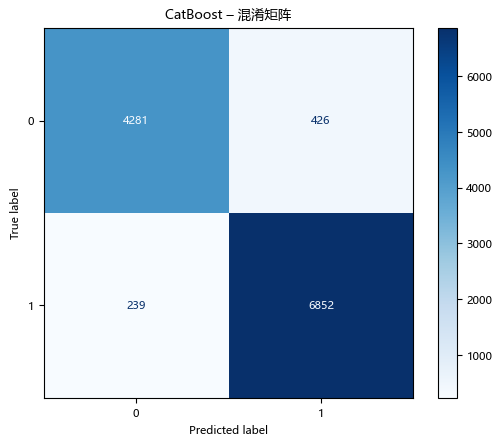

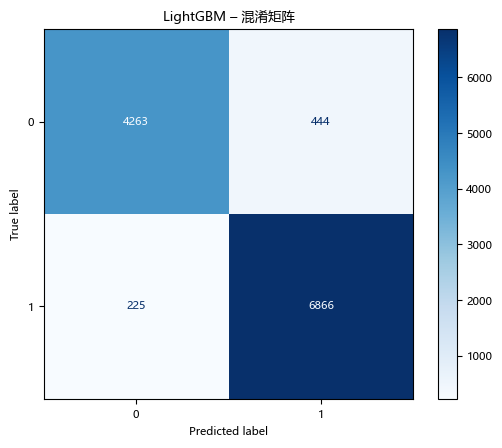

In [21]:
# 模拟数据结构
X = binary_data.drop(columns=['Target'])  # 删除 'Target' 列，得到特征
y = binary_data['Target']

# 拆分训练/测试集
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2, 
                                                    stratify=y, 
                                                    random_state=42)

# 预处理：标准化
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 定义模型
# 设定参数搜索空间
catboost_param_dist = {
    'clf__iterations': randint(100, 500),
    'clf__learning_rate': uniform(0.01, 0.1),
    'clf__depth': randint(4, 10),
    'clf__l2_leaf_reg': uniform(1, 5)
}

lgbm_param_dist = {
    'clf__n_estimators': randint(100, 500),
    'clf__learning_rate': uniform(0.01, 0.1),
    'clf__max_depth': randint(4, 10),
    'clf__num_leaves': randint(15, 60),
    'clf__reg_alpha': uniform(0, 2),
    'clf__reg_lambda': uniform(0, 2),
    'clf__subsample': uniform(0.6, 0.4),
    'clf__colsample_bytree': uniform(0.6, 0.4)
}

# 定义基础模型
catboost_base = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('clf', CatBoostClassifier(loss_function='MultiClass', verbose=0, random_state=42))
])

lgbm_base = Pipeline([
    ('smote', SMOTE(random_state=42)),
    ('clf', LGBMClassifier(class_weight='balanced', verbosity=-1, random_state=42))
])

# 搜索器定义
catboost_search = RandomizedSearchCV(
    estimator=catboost_base,
    param_distributions=catboost_param_dist,
    n_iter=20,
    cv=3,
    scoring='f1_weighted',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

lgbm_search = RandomizedSearchCV(
    estimator=lgbm_base,
    param_distributions=lgbm_param_dist,
    n_iter=20,
    cv=3,
    scoring='f1_weighted',
    verbose=1,
    random_state=42,
    n_jobs=-1
)

# 调参模型集合
models = {
    'CatBoost': catboost_search,
    'LightGBM': lgbm_search
}

results = []
conf_matrices = {}
feature_importances = {}

for name, model in models.items():
    pipe = Pipeline(steps=[
        ('smote', SMOTE(random_state=42)),
        ('clf', model)
    ])

    # 训练模型并计时
    start_time = time.time()
    pipe.fit(X_train_scaled, y_train)
    train_time = time.time() - start_time

    print(f"\n{name} 最佳参数：")
    print(model.best_params_)

    # 预测结果
    y_pred = pipe.predict(X_test_scaled)

    # 计算评估指标
    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    cm = confusion_matrix(y_test, y_pred)
    conf_matrices[name] = cm

    print(f"\n{name} 分类报告:")
    print(classification_report(y_test, y_pred, digits=4))

    # 保存结果
    results.append({
        'Model': name,
        'Accuracy': acc,
        'F1 Score': f1,
        'Train Time (s)': train_time
    })

    # === 提取特征重要性（注意要取分类器） ===
    clf = pipe.named_steps['clf']
    if hasattr(clf, 'feature_importances_'):
        feature_importance = clf.feature_importances_
        feature_importances[name] = pd.DataFrame({
            'Feature': X.columns,
            'Importance': feature_importance
        }).sort_values(by='Importance', ascending=False)

# 评估指标表格输出
results_df = pd.DataFrame(results)
print("模型评估指标：")
print(results_df)

# 绘制混淆矩阵
for name, cm in conf_matrices.items():
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'{name} – 混淆矩阵')
    plt.show()

# 绘制特征重要性图和表格
for name, df in feature_importances.items():
    print(f"\n{name} 特征重要性（前10个）：")
    print(df.head(10))  # 显示前10个最重要特征

    plt.figure(figsize=(10, 6), dpi=300)
    plt.barh(df['Feature'][:10][::-1], df['Importance'][:10][::-1])  # 画前10个
    plt.xlabel("Importance")
    plt.title(f"{name} – 特征重要性得分")
    plt.tight_layout()
    plt.show()